# Matrix Profile

I am testing Matrix Profile to detect anomalies. In addition, I am also testing Plotly.

I am following https://matrixprofile.org/posts/nyc-taxi-analysis-anomalies-python/

In [1]:
import numpy as np
import pandas as pd
import matrixprofile as mp
from datetime import datetime

from pylab import rcParams
import matplotlib.ticker as plticker
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
import ipywidgets as widgets
import plotly.graph_objects as go
import plotly.express as px
 
from ipywidgets import interact
 
import plotly.io as pio

In [3]:
### loading data
dataset = mp.datasets.load('nyc-taxi-anomalies.csv')

In [4]:
df         = pd.DataFrame(dataset['data'], dataset['datetime'])
df.columns = ['passengers']

df.head()

,passengers
2014-07-01 00:00:00,10844.0
2014-07-01 00:30:00,8127.0
2014-07-01 01:00:00,6210.0
2014-07-01 01:30:00,4656.0
2014-07-01 02:00:00,3820.0


Text(0.5, 0, 'Datetime')

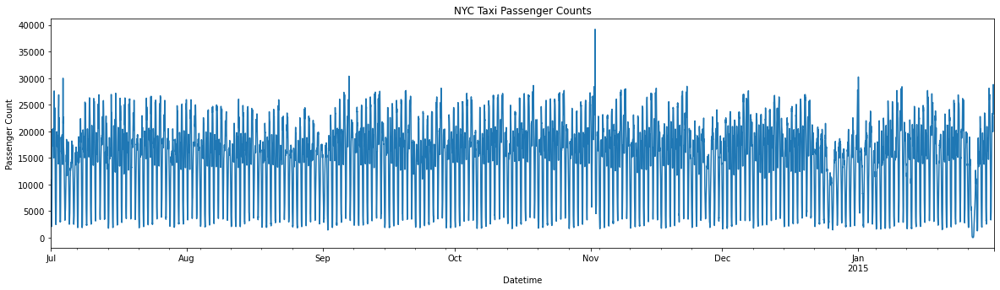

In [5]:
df.plot(figsize = (20, 5), legend = False, title = 'NYC Taxi Passenger Counts')

# plt.title('NYC Taxi Passenger Counts')
plt.ylabel('Passenger Count')
plt.xlabel('Datetime')

### Compute Matrix Profile, Discover Motifs, Discords and Visualize

- Motifs: repeated patterns
- Discords: subsequence that is most dissimilar to its nearest neighbor

Moreover, since the dataset is in 30 minute intervals, we will evaluate the following windows size:
- 24 - 12 hours
- 48 - 24 hours (1 day)
- 240 - 5 days
- 336 - 7 days
- 480 - 10 days
- 1440 - 30 days

In [6]:
# this is to fill nan values
# pk = {
#     'window': 5,
#     'impute_method': 'mean',
#     'impute_direction': 'forward',
#     'add_noise': False
# }

windows  = [24, 48, 240, 336, 480, 1440]
profiles = dict()

%time
# profiles['default'] = {w:mp.compute(dataset.values, windows = w, preprocessing_kwargs = pk) for w in windows}
profiles['default'] = {w: mp.compute(df['passengers'].values, windows = w) for w in windows}

CPU times: user 3 µs, sys: 1 µs, total: 4 µs
Wall time: 6.91 µs


#### Plot provided by the library

Used parameters (from https://matrixprofile.docs.matrixprofile.org/api.html#matrixprofile.compute):

- exclusion_zone: Desired number of values to exclude on both sides of the motif. This avoids trivial matches. It defaults to half of the computed window size. Setting the exclusion zone to 0 makes it not apply.

- k: Desired number of motifs to find.

default 24


/home/isadora/anaconda3/lib/python3.8/site-packages/matrixprofile/algorithms/regimes.py:81: RuntimeWarning: invalid value encountered in true_divide
  idealized = cross_count / idealized
/home/isadora/anaconda3/lib/python3.8/site-packages/matrixprofile/algorithms/regimes.py:84: RuntimeWarning: invalid value encountered in greater
  idealized[idealized > 1] = 1
/home/isadora/anaconda3/lib/python3.8/site-packages/matrixprofile/visualize.py:375: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


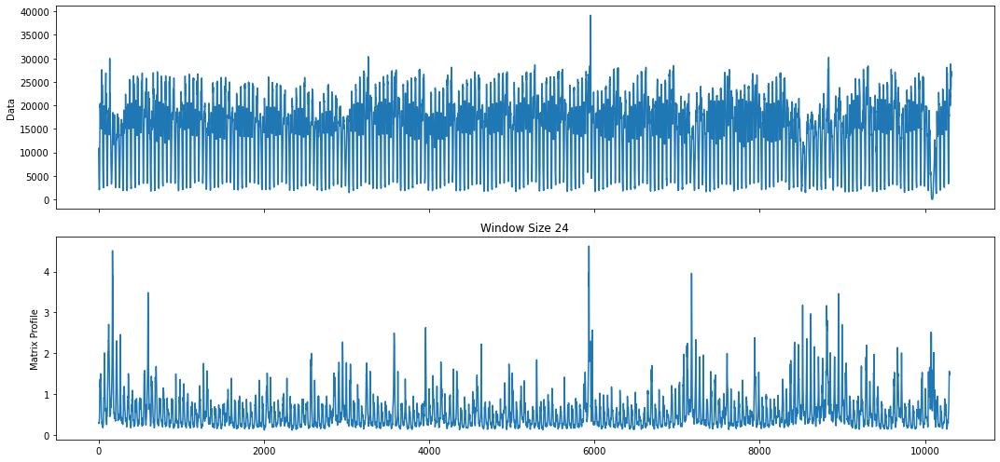

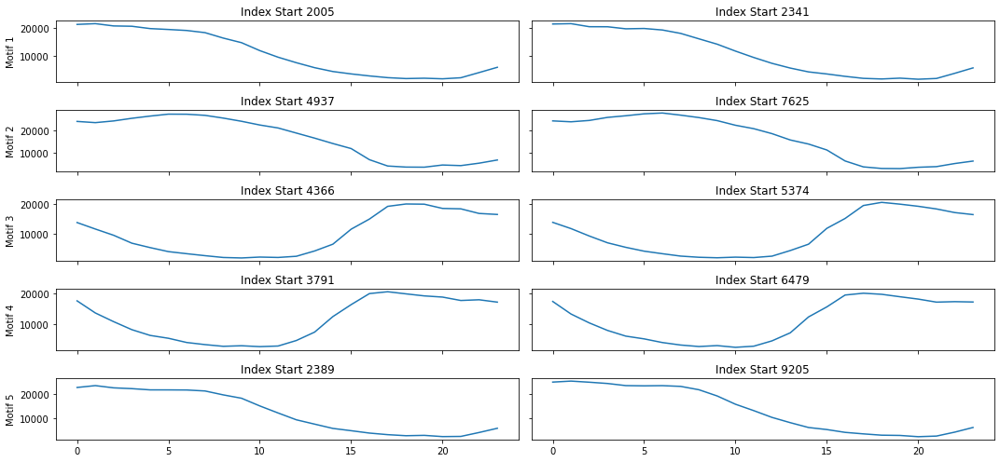

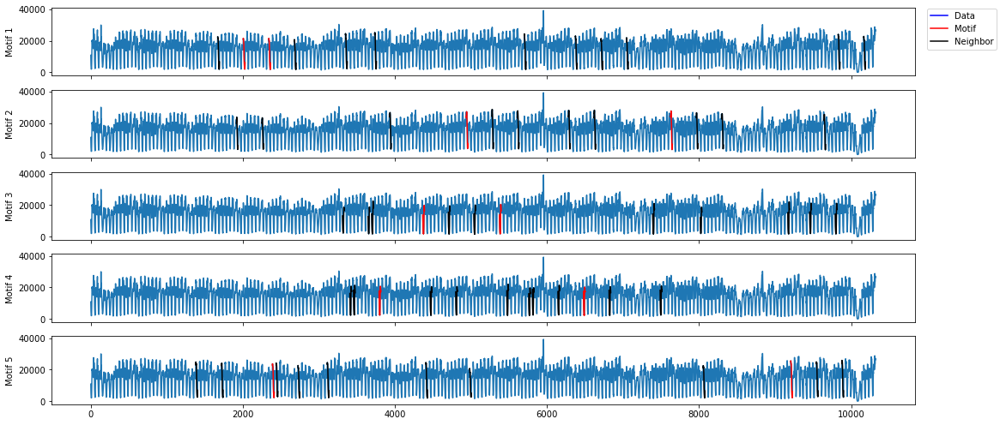

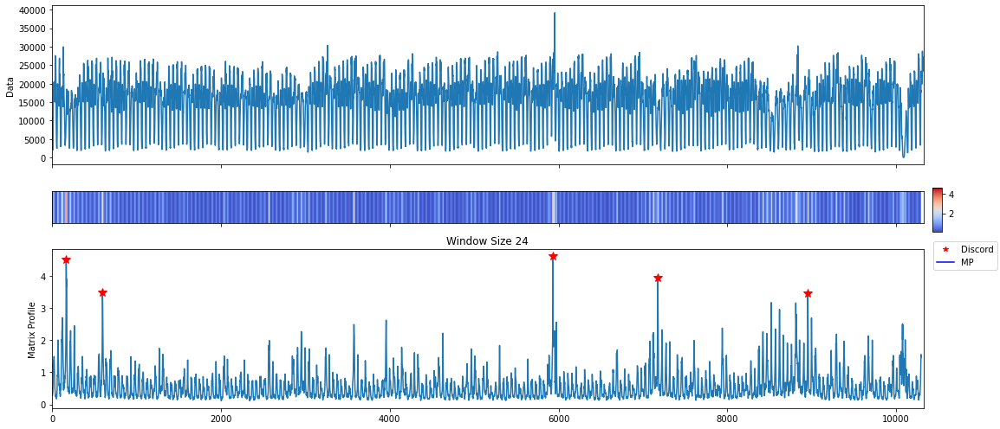

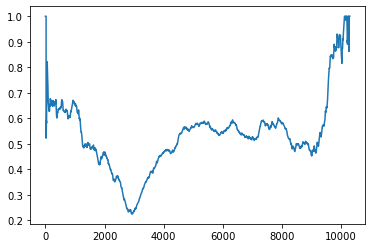

default 48


/home/isadora/anaconda3/lib/python3.8/site-packages/matrixprofile/algorithms/regimes.py:81: RuntimeWarning: invalid value encountered in true_divide
  idealized = cross_count / idealized
/home/isadora/anaconda3/lib/python3.8/site-packages/matrixprofile/algorithms/regimes.py:84: RuntimeWarning: invalid value encountered in greater
  idealized[idealized > 1] = 1
/home/isadora/anaconda3/lib/python3.8/site-packages/matrixprofile/visualize.py:375: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


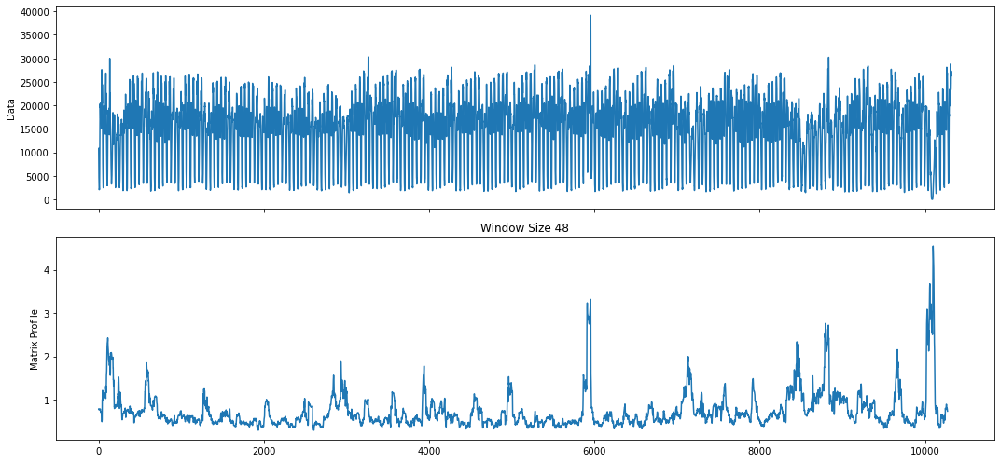

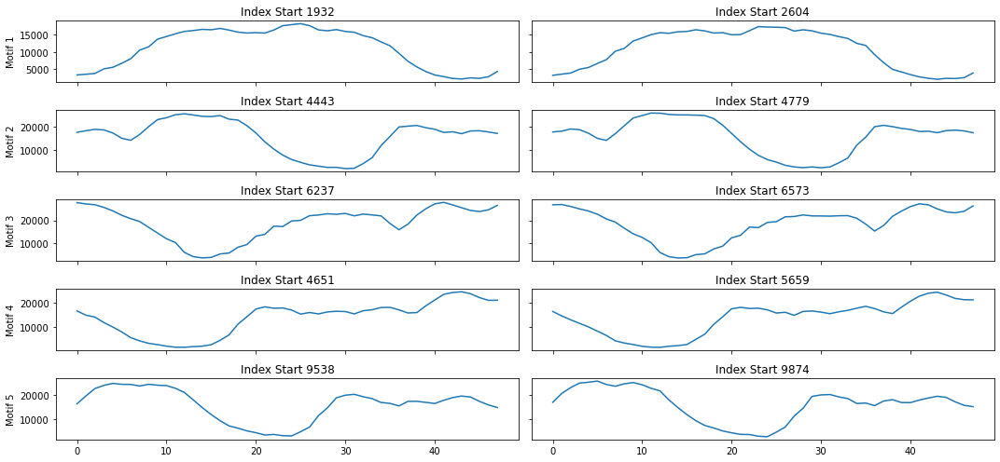

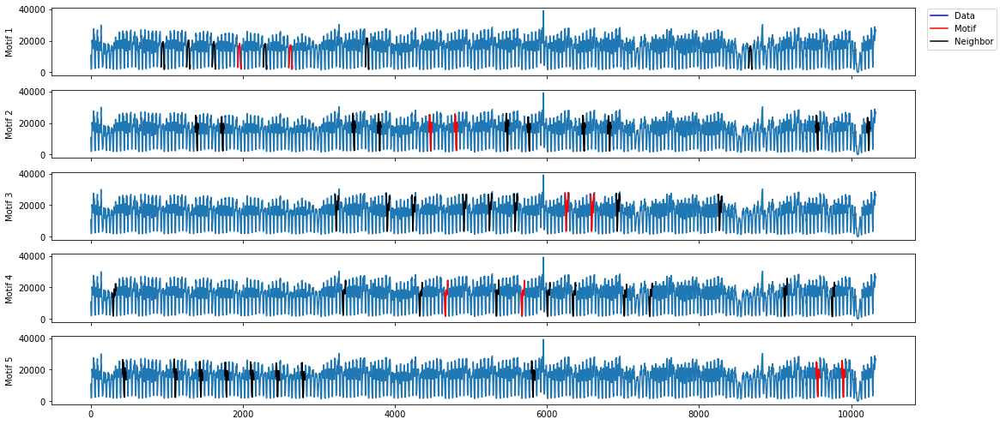

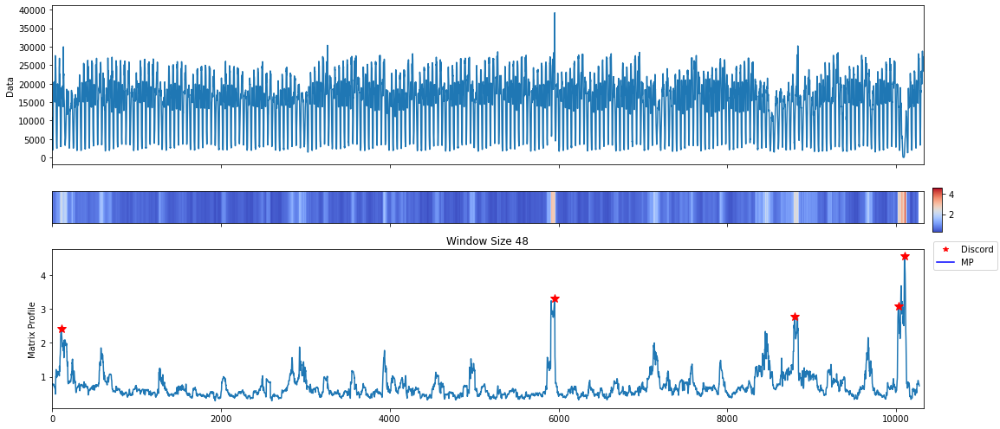

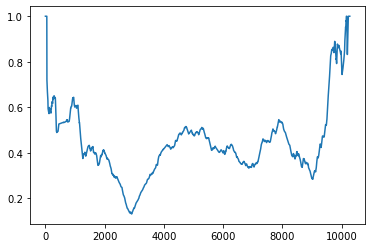

default 240


/home/isadora/anaconda3/lib/python3.8/site-packages/matrixprofile/algorithms/regimes.py:81: RuntimeWarning: invalid value encountered in true_divide
  idealized = cross_count / idealized
/home/isadora/anaconda3/lib/python3.8/site-packages/matrixprofile/algorithms/regimes.py:84: RuntimeWarning: invalid value encountered in greater
  idealized[idealized > 1] = 1
/home/isadora/anaconda3/lib/python3.8/site-packages/matrixprofile/visualize.py:375: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


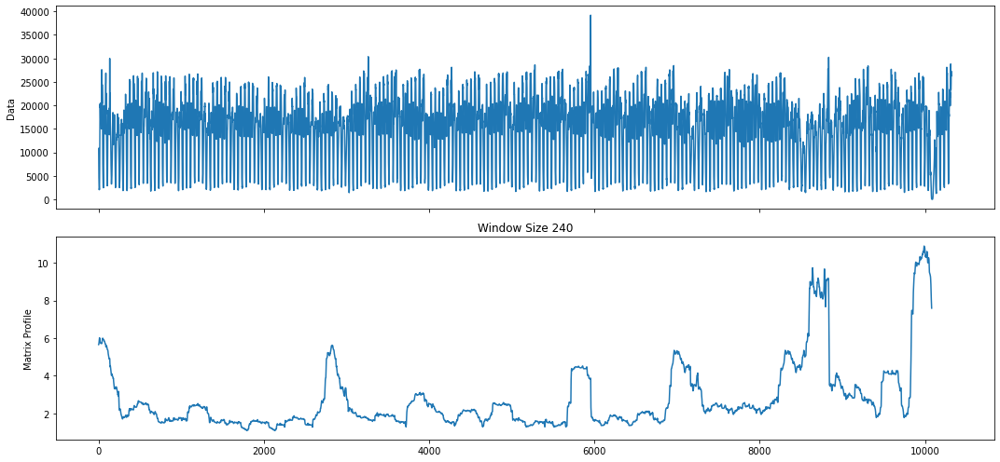

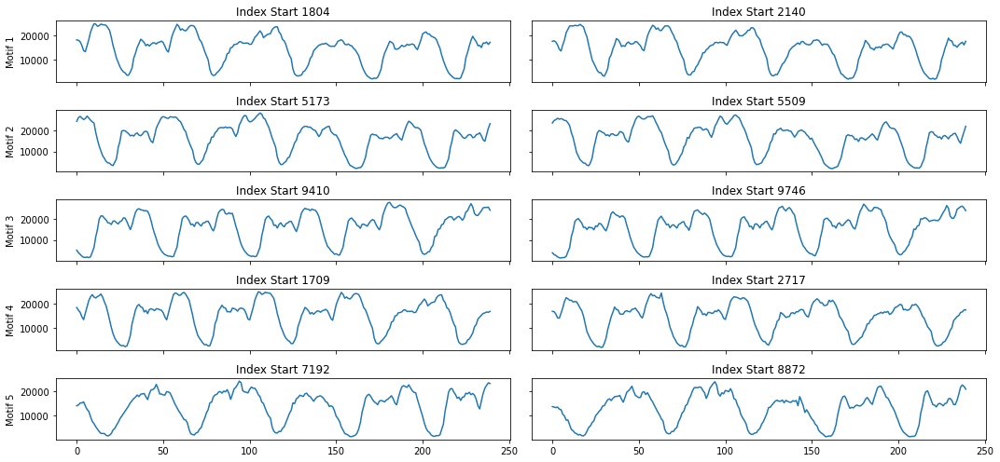

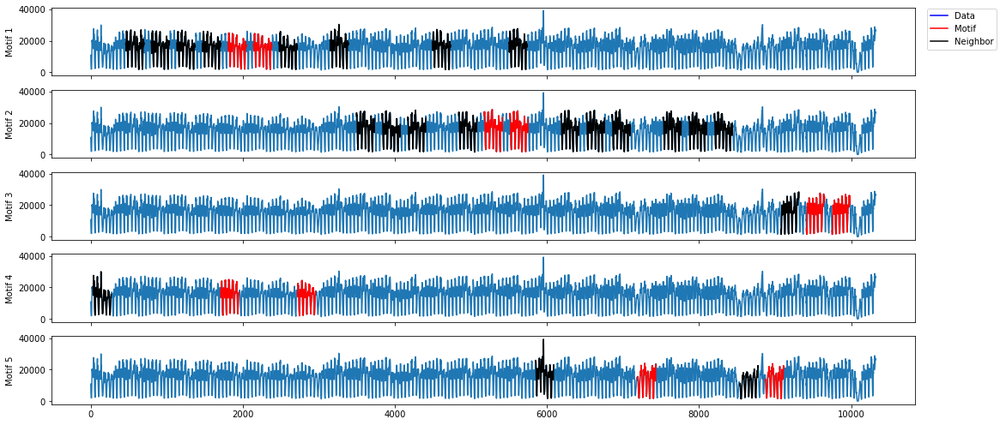

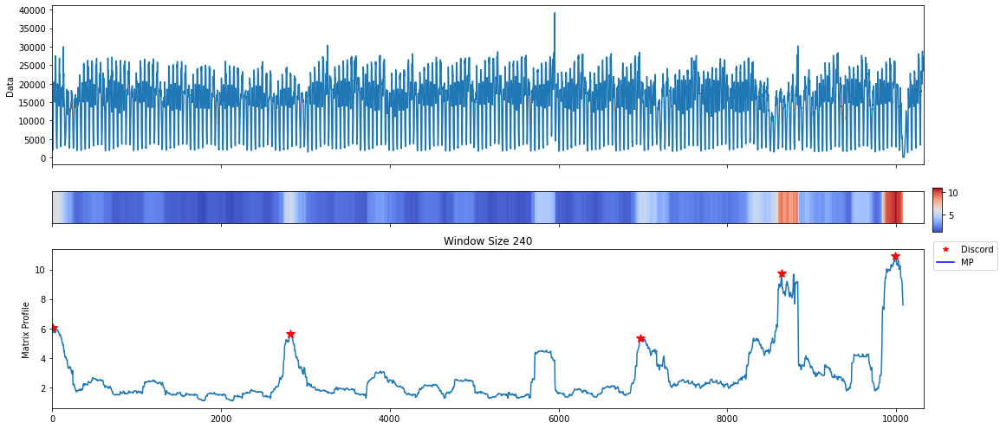

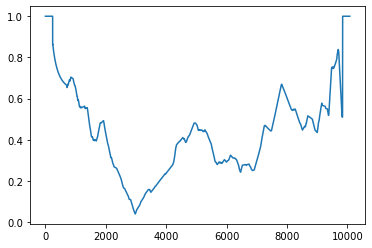

default 336


/home/isadora/anaconda3/lib/python3.8/site-packages/matrixprofile/algorithms/regimes.py:81: RuntimeWarning: invalid value encountered in true_divide
  idealized = cross_count / idealized
/home/isadora/anaconda3/lib/python3.8/site-packages/matrixprofile/algorithms/regimes.py:84: RuntimeWarning: invalid value encountered in greater
  idealized[idealized > 1] = 1
/home/isadora/anaconda3/lib/python3.8/site-packages/matrixprofile/visualize.py:375: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


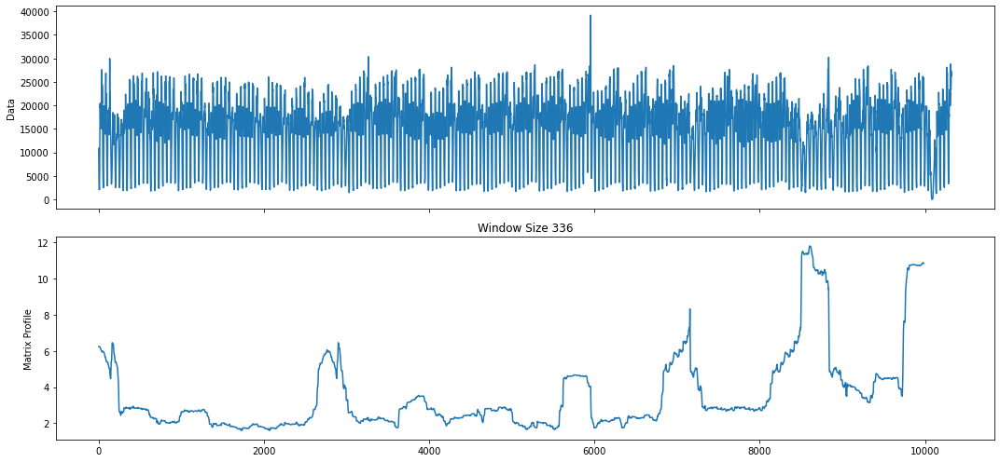

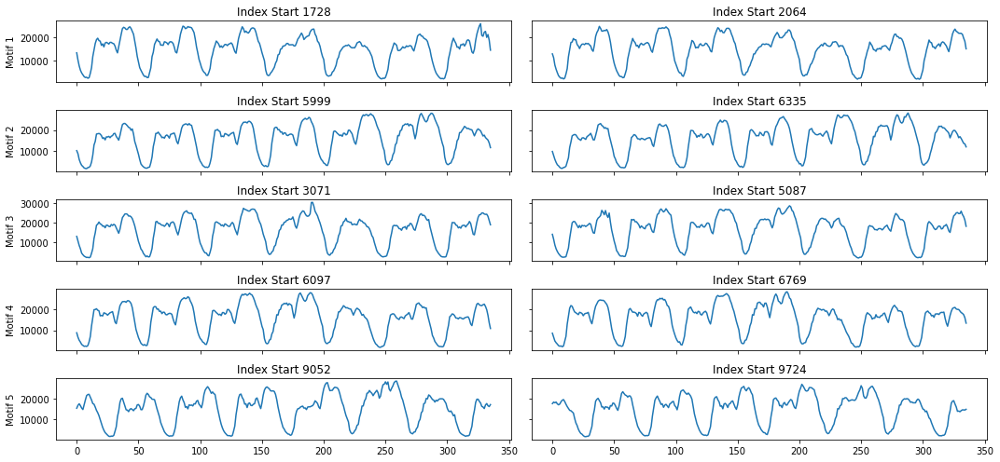

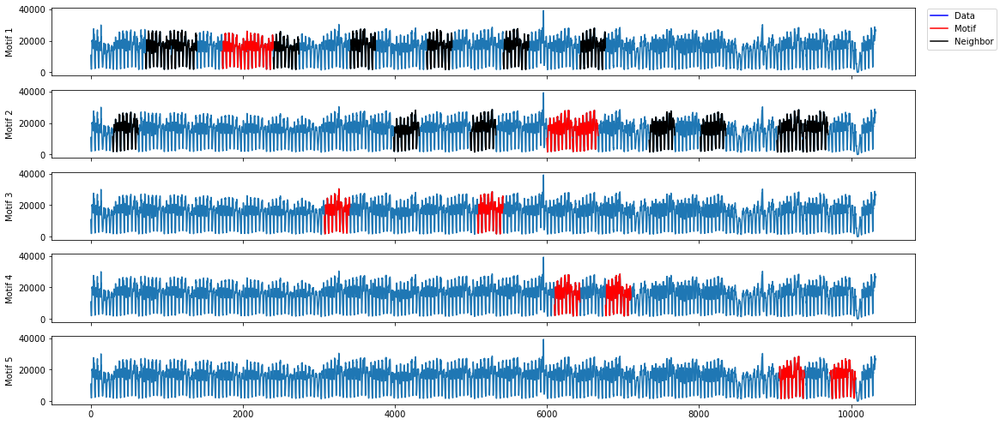

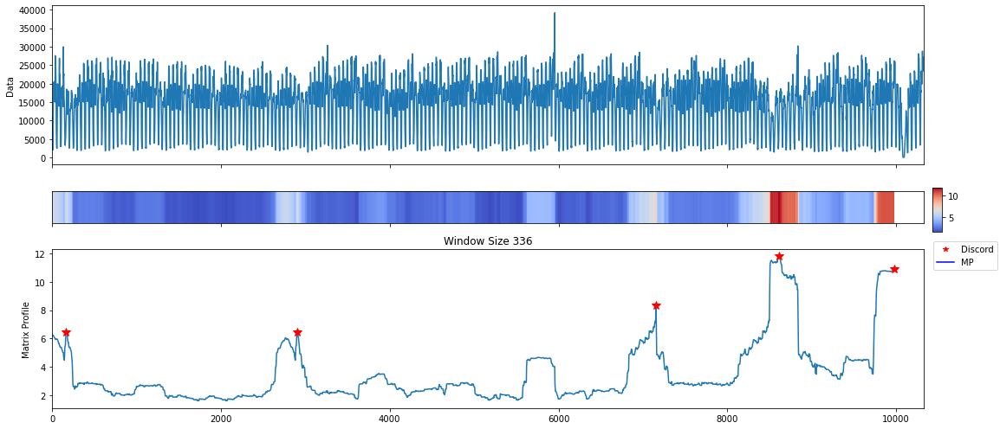

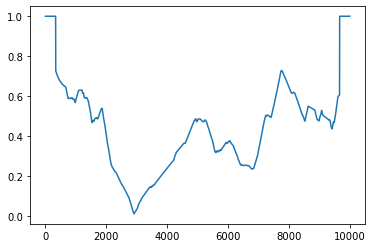

default 480


/home/isadora/anaconda3/lib/python3.8/site-packages/matrixprofile/algorithms/regimes.py:81: RuntimeWarning: invalid value encountered in true_divide
  idealized = cross_count / idealized
/home/isadora/anaconda3/lib/python3.8/site-packages/matrixprofile/algorithms/regimes.py:84: RuntimeWarning: invalid value encountered in greater
  idealized[idealized > 1] = 1
/home/isadora/anaconda3/lib/python3.8/site-packages/matrixprofile/visualize.py:375: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


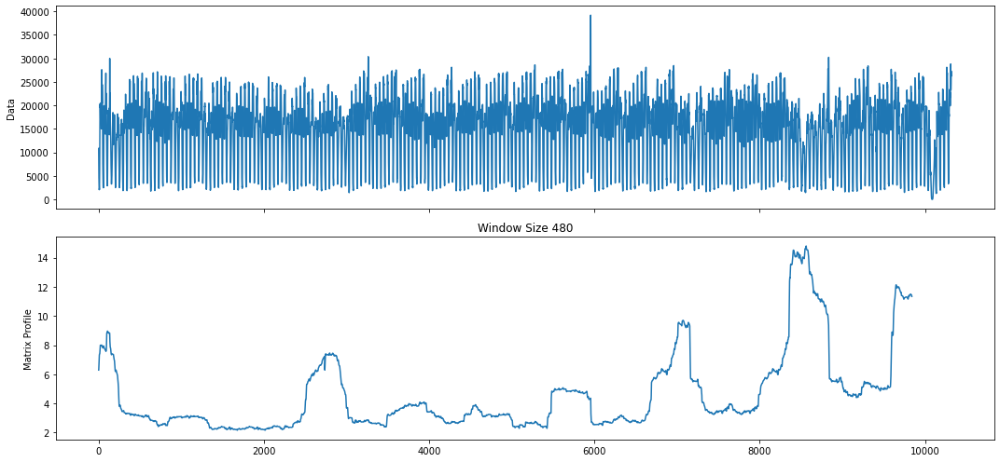

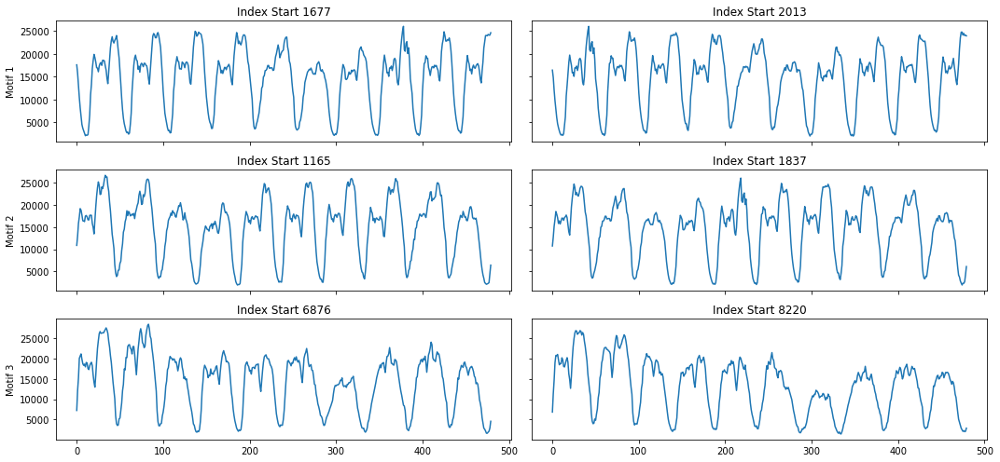

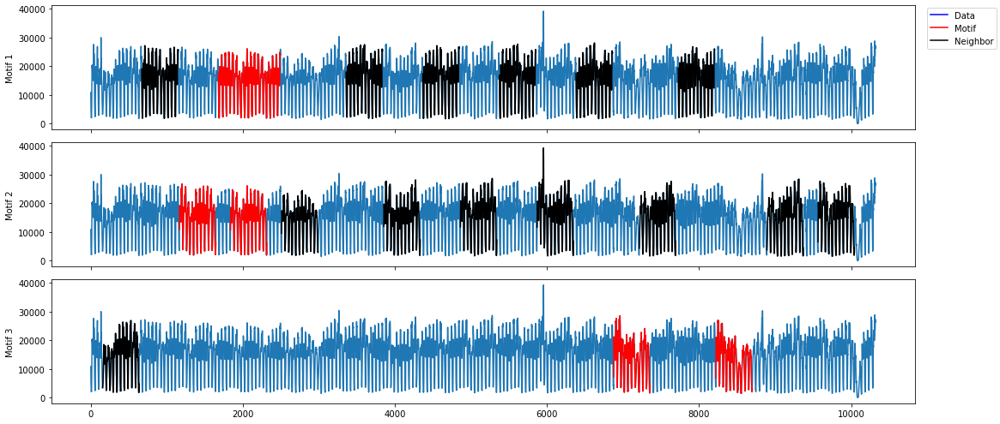

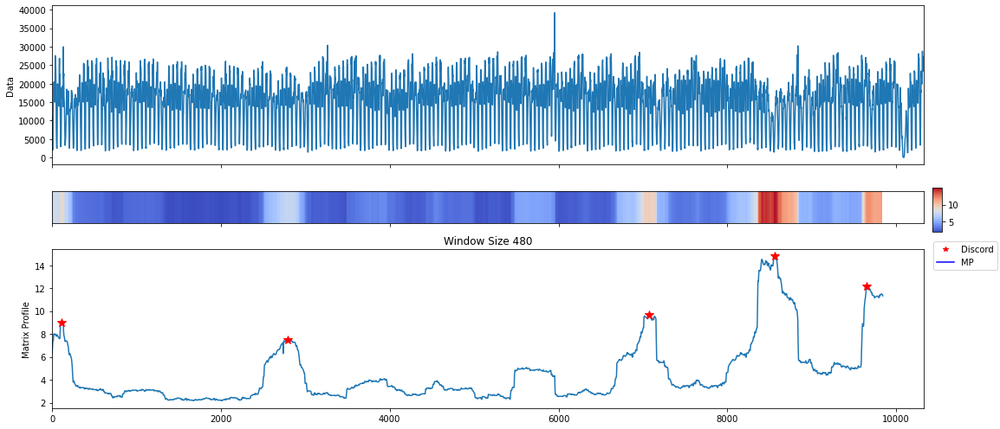

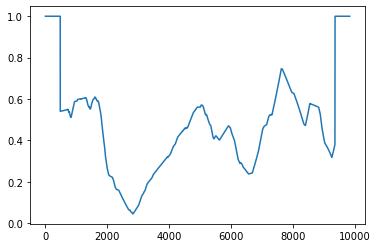

default 1440


/home/isadora/anaconda3/lib/python3.8/site-packages/matrixprofile/algorithms/regimes.py:81: RuntimeWarning: invalid value encountered in true_divide
  idealized = cross_count / idealized
/home/isadora/anaconda3/lib/python3.8/site-packages/matrixprofile/algorithms/regimes.py:84: RuntimeWarning: invalid value encountered in greater
  idealized[idealized > 1] = 1
/home/isadora/anaconda3/lib/python3.8/site-packages/matrixprofile/visualize.py:375: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


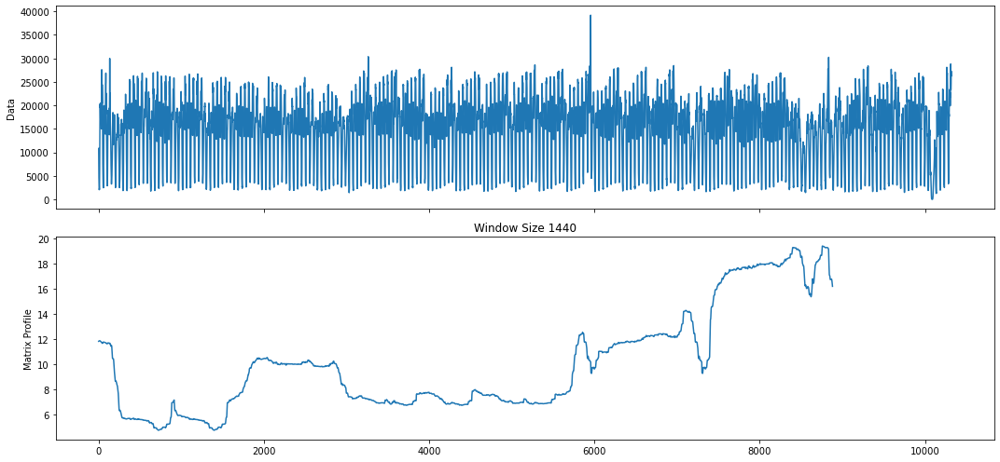

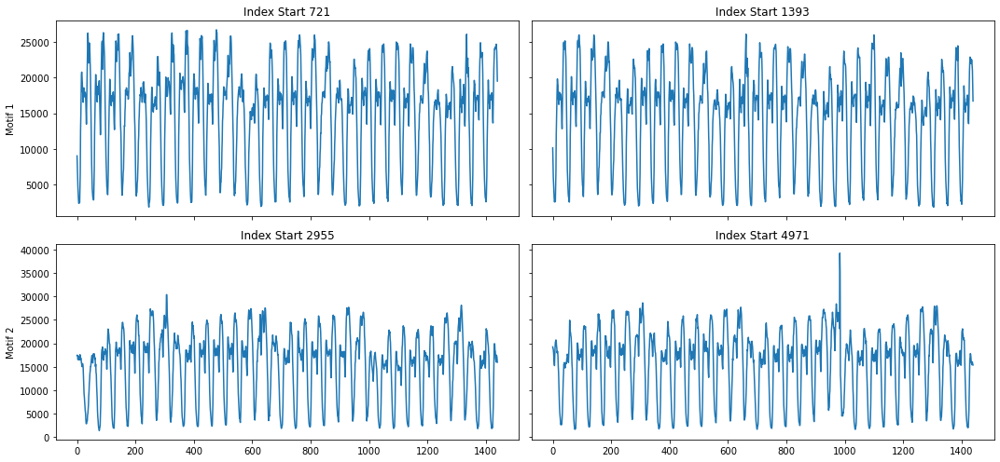

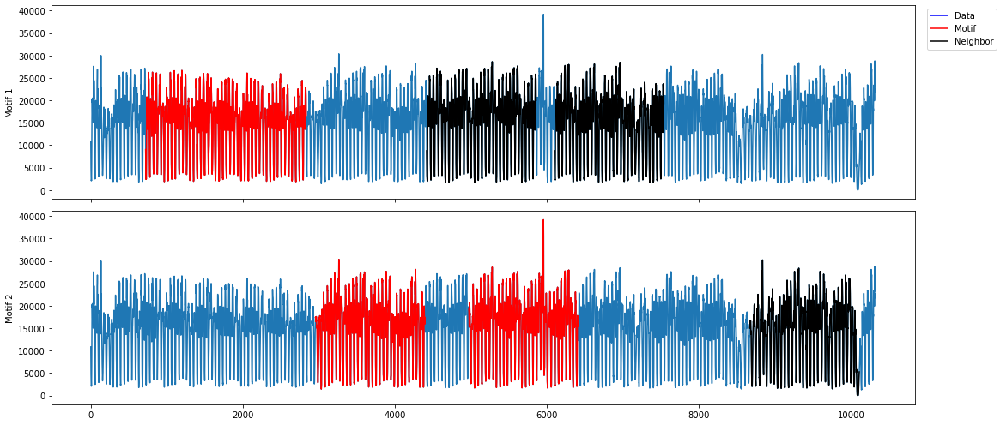

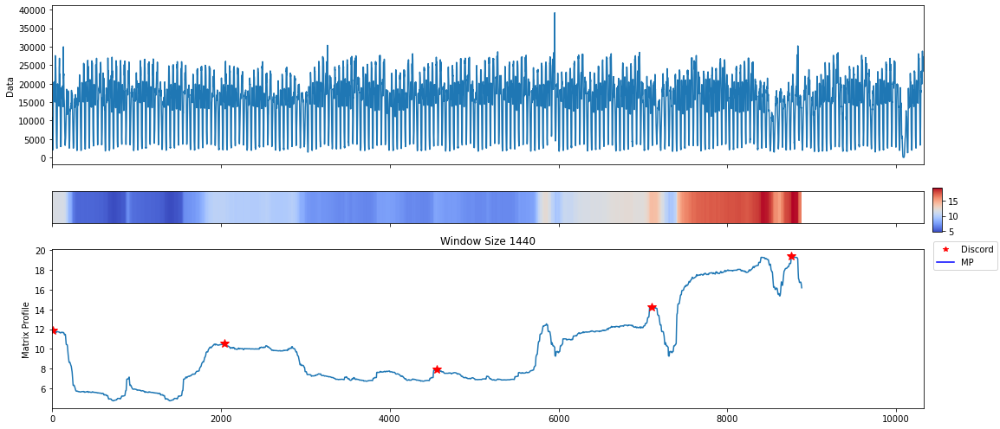

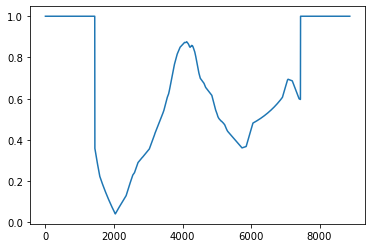

In [7]:
for i in profiles:
    for w in profiles[i]:
        
        print(i, w)
        
        profiles[i][w] = mp.discover.motifs(profiles[i][w], exclusion_zone = w, k = 5)
        profiles[i][w] = mp.discover.discords(profiles[i][w], exclusion_zone = w, k = 5)
        
        regimes = mp.discover.regimes(profiles[i][w])
        
        fig = mp.visualize(profiles[i][w])
        
        plt.show()
        plt.plot(regimes['cac'])
        plt.show()

#### Evaluating separately the motifs and discords in data

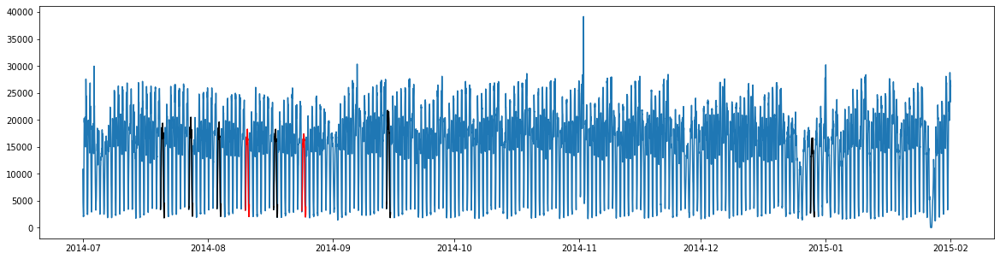

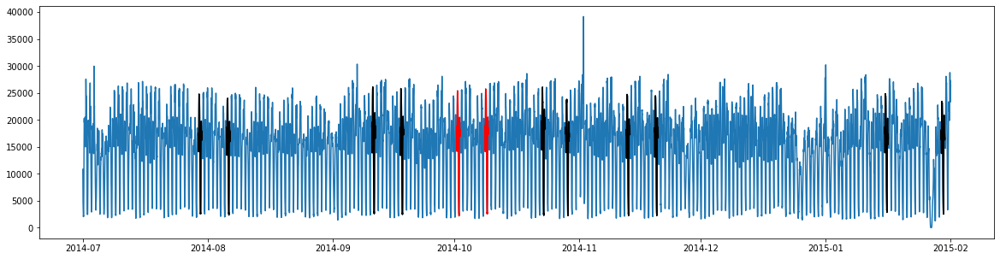

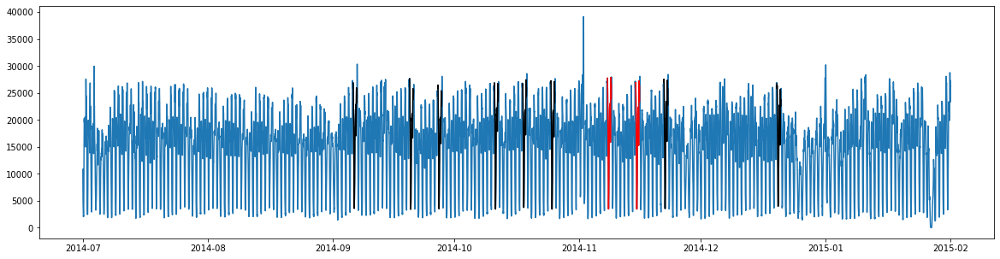

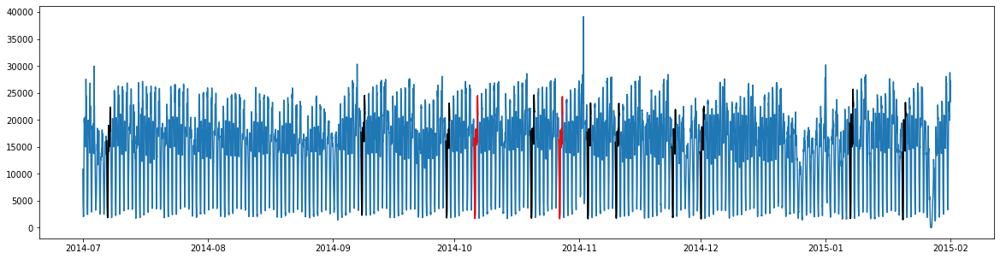

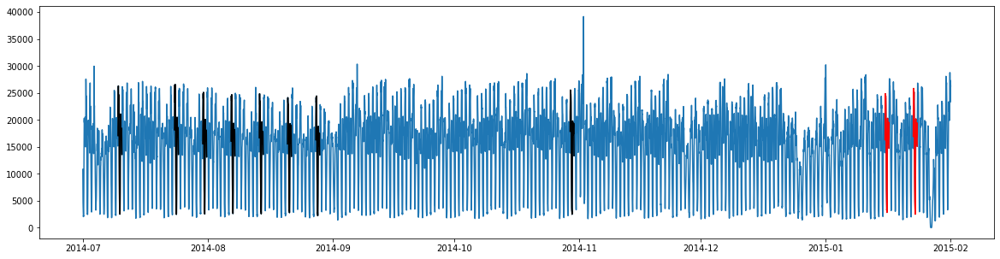

In [8]:
i = 'default'
w = 48

daily_motifs = mp.discover.motifs(profiles[i][w], exclusion_zone = w, k = 5)

for motif in daily_motifs['motifs']:

    plt.figure(figsize = (20, 5))
    plt.plot(df['passengers'])

    m1 = motif['motifs'][0]
    m2 = motif['motifs'][1]

    plt.plot(df['passengers'][m1:m1 + w], color = 'red')
    plt.plot(df['passengers'][m2:m2 + w], color = 'red')
    
    for n in motif['neighbors']:
        plt.plot(df['passengers'][n:n + w], color = 'black')

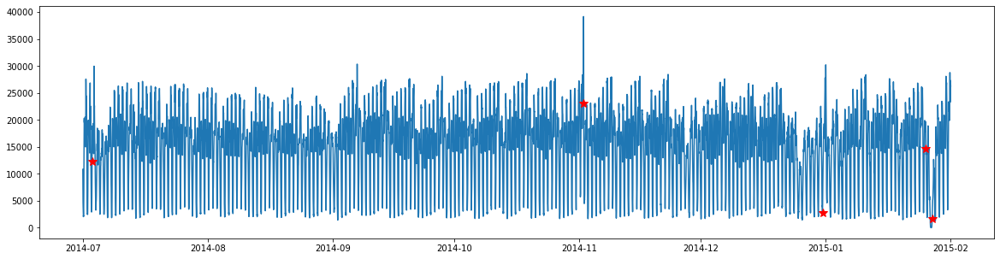

In [9]:
plt.figure(figsize=(20, 5))
plt.plot(df['passengers'])

daily_profile = mp.discover.discords(profiles[i][w], exclusion_zone = w, k = 5)

for discord in daily_profile['discords']:
    
    dt  = df['passengers'].index[discord]
    val = df['passengers'][discord]
    
    plt.plot(dt, val, c='r', marker='*', markersize=10)

#### Interactive plot

In [15]:
i = 'default'
w = 48

daily_motifs = mp.discover.motifs(profiles[i][w], exclusion_zone = w, k = 5)

for motif in daily_motifs['motifs']:

    fig = go.Figure()

    # Add traces  
    fig.add_trace(go.Scatter(x = df.index, y = df['passengers'].values, mode='lines', name='Sensor'))

    m1 = motif['motifs'][0]

    motif1_index  = df.index[m1:m1 + w]
    motif1_values = df['passengers'][m1:m1 + w].values

    fig.add_trace(go.Scatter(x = motif1_index, y = motif1_values, mode = 'lines', name = 'Motif 1', 
                             line_color = 'red'))
    
    m2 = motif['motifs'][1]

    motif2_index  = df['passengers'].index[m2:m2 + w]
    motif2_values = df['passengers'][m2:m2 + w].values

    fig.add_trace(go.Scatter(x = motif2_index, y = motif2_values, mode = 'lines', name = 'Motif 2', 
                             line_color = 'red'))
    

    for enum, n in enumerate(motif['neighbors']):

        neighbor_index  = df['passengers'].index[n:n + w]
        neighbor_values = df['passengers'][n:n + w].values

        fig.add_trace(go.Scatter(x = neighbor_index, y = neighbor_values, mode = 'lines', 
                                 name = f'Neighbor {enum + 1}', line_color = 'black'))  
        
        
    fig.update_layout(title = f"Motifs found in {w // 2} hours")
        
    fig.show()

In [13]:
daily_profile = mp.discover.discords(profiles[i][w], exclusion_zone = w, k = 5)

fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x = df.index, y = df['passengers'].values, mode='lines', name='Sensor',
#                         line_color = "midnightblue"
                        ))


discords_index  = df.index[daily_profile['discords']]
discords_values = df['passengers'][daily_profile['discords']]

fig.add_trace(go.Scatter(x = discords_index, y = discords_values, mode = 'markers', name = 'Discords', 
                        marker_symbol = 'star', marker_size = 10, marker_color = 'red'))

fig.show()

In [18]:
#@title Matrix Profile - Motifs
windows = [24, 48, 240, 336, 480, 1440]

@interact
def aux_plot_motif(windows = windows):
    
    ts             = df.copy()
    
    matrix_profile = mp.compute(ts['passengers'].values, windows = windows)
    
    all_discords   = mp.discover.discords(matrix_profile, exclusion_zone = windows, k = 5)
    
    all_motifs     = mp.discover.motifs(matrix_profile, exclusion_zone = windows, k = 5, max_neighbors = 3)
    
    all_colors     = px.colors.qualitative.G10
    
    fig = go.Figure()

    # Add traces  
    fig.add_trace(go.Scatter(x = ts.index, y = ts['passengers'], mode='lines', name='Sensor', 
                             line_color = all_colors[0], opacity = 0.6))
    
    
    fig.add_trace(go.Scatter(x = ts.index[all_discords['discords']], y = ts['passengers'][all_discords['discords']], 
                             mode = 'markers', marker_symbol = 'star', marker_size = 10, marker_color = 'red',
                             name = 'Discords'))
    
    
    for enum1, motif in enumerate(all_motifs['motifs']):
        enum1 = enum1 + 2 # pra pular as duas primeiras cores

        m1 = motif['motifs'][0]

        motif1_index  = ts[m1:m1 + windows].index
        motif1_values = ts['passengers'][m1:m1 + windows]

        fig.add_trace(go.Scatter(x = motif1_index, y = motif1_values, mode = 'lines', name = 'Motif 1', 
                                 line_color = all_colors[enum1]))

        m2 = motif['motifs'][1]

        motif2_index  = ts[m2:m2 + windows].index
        motif2_values = ts['passengers'][m2:m2 + windows]

        fig.add_trace(go.Scatter(x = motif2_index, y = motif2_values, mode = 'lines', name = 'Motif 2', 
                                 line_color = all_colors[enum1]))
        
        
        for enum2, n in enumerate(motif['neighbors']):
            
            enum2 = enum2 + 1

            neighbor_index  = ts[n:n + windows].index
            neighbor_values = ts['passengers'][n:n + windows]

            fig.add_trace(go.Scatter(x = neighbor_index, y = neighbor_values, mode = 'lines', line_dash = "dot", 
                                     name = f'Neighbor {enum2}', line_color = all_colors[enum1])) 
                   
        if windows == 24:
            fig.update_layout(title = f"Motifs and Discords found in 12 hours")

        else:
            title = f'({windows // 48} days)'
            fig.update_layout(title = f"Motifs and Discords found in {windows // 2} hours " + title)

#         fig.show()
        
    return fig

interactive(children=(Dropdown(description='windows', options=(24, 48, 240, 336, 480, 1440), value=24), Output…